Zrinka Pećanić<br>
*0036517187*<br>
*FER*<br>

**Predmet: Uvod u znanost o podacima**<br>
<br>
Naziv članka: *A Machine Learning Approach for the 
Classification of Cardiac Arrhythmia* <br>



**1. faza projekta**<br><br>
Ciljevi: 


*   upoznati se sa svakim dijelom dataseta
*   provesti deskriptivnu statistiku
*   smisliti rješenje za nedostajuće vrijednosti
*   napraviti vizualizacije podataka







1. korak: Dodavanje labela kolonama (podaci u .data file-u su bili neoznačeni) <br>
Iz datoteke *label_maker.py* koja je dostupna na GitHubu:<br>


```
labels='Age,Sex,Height,Weight,QRSduration,PRinterval,QTinterval,Tinterval,Pinterval,QRSangle,Tangle,Pangle,QRSTangle,Jangle,HeartRate,'
group1 = ['Qwidth','Rwidth','Swidth','SmallRwidth','SmallSwidth','IntDeflNum','RaggedR','DiphasicR','RaggedP','DiphasicP','RaggedT','DiphasicT']
channels = ['DI', 'DII', 'DIII', 'AVR', 'AVL', 'AVF', 'V1','V2','V3','V4','V5','V6']
group2 = ['JJamp','Qamp','Ramp','Samp','SmallRamp','SmallSamp','Pamp','Tamp','QRSA', 'QRSTA']
#num=15+len(channels)*len(group1)+len(channels)*len(group2)
#print(num) #279 OK

#dodavanje grupe 1
for channel in channels:
    for col in group1:
        new_col= channel+col+',' #new_col= channel+'_'+col+','
        labels+=new_col

#dodavanje grupe 2
for channel in channels:
    for col in group2:
        new_col= channel+col+',' #new_col= channel+'_'+col+',' ako zelimo underscore da odvaja kanale i ono sto je mjereno
        labels+=new_col
labels+="Class" #zadnji stupac je klasa dodijeljena svakoj osobi

labels_list=labels.split(',')
print(len(labels_list))
print(labels_list)
```
<br>
Varijabla labels_list je lista koja sadrži sve značajke i to redom kako su u originalnoj .data datoteci. Zatim dataset pretvaramo u .csv format i na njemu možemo dalje raditi ovdje u bilježnici.


In [1]:
# importing libraries
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest, mutual_info_classif
import matplotlib.pyplot as plt
import seaborn as sns
import csv

In [2]:
u_data = pd.read_csv('/content/data.csv')
# početni podaci u kojima su kolone označene kao Column1,..., Column280.
#data.csv je dobivena pretvorbom originalne .data datoteke u .txt datoteku koja je učitana u Excel da bismo dobili na kraju .csv
print(u_data) 
#u_data.head()
#data labels je kopirana lista dobivena iz label_maker.py
data_labels = ['Age', 'Sex', 'Height', 'Weight', 'QRSduration', 'PRinterval', 'QTinterval', 'Tinterval', 'Pinterval', 'QRSangle', 'Tangle', 'Pangle', 'QRSTangle', 'Jangle', 'HeartRate', 'DIQwidth', 'DIRwidth', 'DISwidth', 'DISmallRwidth', 'DISmallSwidth', 'DIIntDeflNum', 'DIRaggedR', 'DIDiphasicR', 'DIRaggedP', 'DIDiphasicP', 'DIRaggedT', 'DIDiphasicT', 'DIIQwidth', 'DIIRwidth', 'DIISwidth', 'DIISmallRwidth', 'DIISmallSwidth', 'DIIIntDeflNum', 'DIIRaggedR', 'DIIDiphasicR', 'DIIRaggedP', 'DIIDiphasicP', 'DIIRaggedT', 'DIIDiphasicT', 'DIIIQwidth', 'DIIIRwidth', 'DIIISwidth', 'DIIISmallRwidth', 'DIIISmallSwidth', 'DIIIIntDeflNum', 'DIIIRaggedR', 'DIIIDiphasicR', 'DIIIRaggedP', 'DIIIDiphasicP', 'DIIIRaggedT', 'DIIIDiphasicT', 'AVRQwidth', 'AVRRwidth', 'AVRSwidth', 'AVRSmallRwidth', 'AVRSmallSwidth', 'AVRIntDeflNum', 'AVRRaggedR', 'AVRDiphasicR', 'AVRRaggedP', 'AVRDiphasicP', 'AVRRaggedT', 'AVRDiphasicT', 'AVLQwidth', 'AVLRwidth', 'AVLSwidth', 'AVLSmallRwidth', 'AVLSmallSwidth', 'AVLIntDeflNum', 'AVLRaggedR', 'AVLDiphasicR', 'AVLRaggedP', 'AVLDiphasicP', 'AVLRaggedT', 'AVLDiphasicT', 'AVFQwidth', 'AVFRwidth', 'AVFSwidth', 'AVFSmallRwidth', 'AVFSmallSwidth', 'AVFIntDeflNum', 'AVFRaggedR', 'AVFDiphasicR', 'AVFRaggedP', 'AVFDiphasicP', 'AVFRaggedT', 'AVFDiphasicT', 'V1Qwidth', 'V1Rwidth', 'V1Swidth', 'V1SmallRwidth', 'V1SmallSwidth', 'V1IntDeflNum', 'V1RaggedR', 'V1DiphasicR', 'V1RaggedP', 'V1DiphasicP', 'V1RaggedT', 'V1DiphasicT', 'V2Qwidth', 'V2Rwidth', 'V2Swidth', 'V2SmallRwidth', 'V2SmallSwidth', 'V2IntDeflNum', 'V2RaggedR', 'V2DiphasicR', 'V2RaggedP', 'V2DiphasicP', 'V2RaggedT', 'V2DiphasicT', 'V3Qwidth', 'V3Rwidth', 'V3Swidth', 'V3SmallRwidth', 'V3SmallSwidth', 'V3IntDeflNum', 'V3RaggedR', 'V3DiphasicR', 'V3RaggedP', 'V3DiphasicP', 'V3RaggedT', 'V3DiphasicT', 'V4Qwidth', 'V4Rwidth', 'V4Swidth', 'V4SmallRwidth', 'V4SmallSwidth', 'V4IntDeflNum', 'V4RaggedR', 'V4DiphasicR', 'V4RaggedP', 'V4DiphasicP', 'V4RaggedT', 'V4DiphasicT', 'V5Qwidth', 'V5Rwidth', 'V5Swidth', 'V5SmallRwidth', 'V5SmallSwidth', 'V5IntDeflNum', 'V5RaggedR', 'V5DiphasicR', 'V5RaggedP', 'V5DiphasicP', 'V5RaggedT', 'V5DiphasicT', 'V6Qwidth', 'V6Rwidth', 'V6Swidth', 'V6SmallRwidth', 'V6SmallSwidth', 'V6IntDeflNum', 'V6RaggedR', 'V6DiphasicR', 'V6RaggedP', 'V6DiphasicP', 'V6RaggedT', 'V6DiphasicT', 'DIJJamp', 'DIQamp', 'DIRamp', 'DISamp', 'DISmallRamp', 'DISmallSamp', 'DIPamp', 'DITamp', 'DIQRSA', 'DIQRSTA', 'DIIJJamp', 'DIIQamp', 'DIIRamp', 'DIISamp', 'DIISmallRamp', 'DIISmallSamp', 'DIIPamp', 'DIITamp', 'DIIQRSA', 'DIIQRSTA', 'DIIIJJamp', 'DIIIQamp', 'DIIIRamp', 'DIIISamp', 'DIIISmallRamp', 'DIIISmallSamp', 'DIIIPamp', 'DIIITamp', 'DIIIQRSA', 'DIIIQRSTA', 'AVRJJamp', 'AVRQamp', 'AVRRamp', 'AVRSamp', 'AVRSmallRamp', 'AVRSmallSamp', 'AVRPamp', 'AVRTamp', 'AVRQRSA', 'AVRQRSTA', 'AVLJJamp', 'AVLQamp', 'AVLRamp', 'AVLSamp', 'AVLSmallRamp', 'AVLSmallSamp', 'AVLPamp', 'AVLTamp', 'AVLQRSA', 'AVLQRSTA', 'AVFJJamp', 'AVFQamp', 'AVFRamp', 'AVFSamp', 'AVFSmallRamp', 'AVFSmallSamp', 'AVFPamp', 'AVFTamp', 'AVFQRSA', 'AVFQRSTA', 'V1JJamp', 'V1Qamp', 'V1Ramp', 'V1Samp', 'V1SmallRamp', 'V1SmallSamp', 'V1Pamp', 'V1Tamp', 'V1QRSA', 'V1QRSTA', 'V2JJamp', 'V2Qamp', 'V2Ramp', 'V2Samp', 'V2SmallRamp', 'V2SmallSamp', 'V2Pamp', 'V2Tamp', 'V2QRSA', 'V2QRSTA', 'V3JJamp', 'V3Qamp', 'V3Ramp', 'V3Samp', 'V3SmallRamp', 'V3SmallSamp', 'V3Pamp', 'V3Tamp', 'V3QRSA', 'V3QRSTA', 'V4JJamp', 'V4Qamp', 'V4Ramp', 'V4Samp', 'V4SmallRamp', 'V4SmallSamp', 'V4Pamp', 'V4Tamp', 'V4QRSA', 'V4QRSTA', 'V5JJamp', 'V5Qamp', 'V5Ramp', 'V5Samp', 'V5SmallRamp', 'V5SmallSamp', 'V5Pamp', 'V5Tamp', 'V5QRSA', 'V5QRSTA', 'V6JJamp', 'V6Qamp', 'V6Ramp', 'V6Samp', 'V6SmallRamp', 'V6SmallSamp', 'V6Pamp', 'V6Tamp', 'V6QRSA', 'V6QRSTA', 'Class']
#print(u_data.columns)
  
u_data.set_axis(data_labels, axis='columns', inplace=True) #postavljanje naziva kolona
  
# nova imena kolona
print(u_data.columns)
print(u_data)

u_data.head()
#novi data frame spremamo u .csv datoteku, ona sada sadrži sve podatke iz originalne .data datoteke ali uz labele zaglavlja (age, sex, height...)
filename = "data_labeled.csv"
u_data.to_csv(filename, index = False)

print(pd.read_csv(filename))



     Column1  Column2  Column3  Column4  Column5  Column6  Column7  Column8  \
0         75        0      190       80       91      193      371      174   
1         56        1      165       64       81      174      401      149   
2         54        0      172       95      138      163      386      185   
3         55        0      175       94      100      202      380      179   
4         75        0      190       80       88      181      360      177   
..       ...      ...      ...      ...      ...      ...      ...      ...   
447       53        1      160       70       80      199      382      154   
448       37        0      190       85      100      137      361      201   
449       36        0      166       68      108      176      365      194   
450       32        1      155       55       93      106      386      218   
451       78        1      160       70       79      127      364      138   

     Column9  Column10  ... Column271 Column272 Col

In [3]:
u_data.shape #očekujemo 452 primjera i 279 značajki + 1 stupac za klasu, ukupno 452x280

(452, 280)

In [4]:
with pd.option_context("display.max_rows", None, 'display.max_columns', None):
    display(u_data)

,Age,Sex,Height,Weight,QRSduration,PRinterval,QTinterval,Tinterval,Pinterval,QRSangle,Tangle,Pangle,QRSTangle,Jangle,HeartRate,DIQwidth,DIRwidth,DISwidth,DISmallRwidth,DISmallSwidth,DIIntDeflNum,DIRaggedR,DIDiphasicR,DIRaggedP,DIDiphasicP,DIRaggedT,DIDiphasicT,DIIQwidth,DIIRwidth,DIISwidth,DIISmallRwidth,DIISmallSwidth,DIIIntDeflNum,DIIRaggedR,DIIDiphasicR,DIIRaggedP,DIIDiphasicP,DIIRaggedT,DIIDiphasicT,DIIIQwidth,DIIIRwidth,DIIISwidth,DIIISmallRwidth,DIIISmallSwidth,DIIIIntDeflNum,DIIIRaggedR,DIIIDiphasicR,DIIIRaggedP,DIIIDiphasicP,DIIIRaggedT,DIIIDiphasicT,AVRQwidth,AVRRwidth,AVRSwidth,AVRSmallRwidth,AVRSmallSwidth,AVRIntDeflNum,AVRRaggedR,AVRDiphasicR,AVRRaggedP,AVRDiphasicP,AVRRaggedT,AVRDiphasicT,AVLQwidth,AVLRwidth,AVLSwidth,AVLSmallRwidth,AVLSmallSwidth,AVLIntDeflNum,AVLRaggedR,AVLDiphasicR,AVLRaggedP,AVLDiphasicP,AVLRaggedT,AVLDiphasicT,AVFQwidth,AVFRwidth,AVFSwidth,AVFSmallRwidth,AVFSmallSwidth,AVFIntDeflNum,AVFRaggedR,AVFDiphasicR,AVFRaggedP,AVFDiphasicP,AVFRaggedT,AVFDiphasicT,V1Qwidth,V1Rwidth,V1Swidth,V1SmallRwidth,V1SmallSwidth,V1IntDeflNum,V1RaggedR,V1DiphasicR,V1RaggedP,V1DiphasicP,V1RaggedT,V1DiphasicT,V2Qwidth,V2Rwidth,V2Swidth,V2SmallRwidth,V2SmallSwidth,V2IntDeflNum,V2RaggedR,V2DiphasicR,V2RaggedP,V2DiphasicP,V2RaggedT,V2DiphasicT,V3Qwidth,V3Rwidth,V3Swidth,V3SmallRwidth,V3SmallSwidth,V3IntDeflNum,V3RaggedR,V3DiphasicR,V3RaggedP,V3DiphasicP,V3RaggedT,V3DiphasicT,V4Qwidth,V4Rwidth,V4Swidth,V4SmallRwidth,V4SmallSwidth,V4IntDeflNum,V4RaggedR,V4DiphasicR,V4RaggedP,V4DiphasicP,V4RaggedT,V4DiphasicT,V5Qwidth,V5Rwidth,V5Swidth,V5SmallRwidth,V5SmallSwidth,V5IntDeflNum,V5RaggedR,V5DiphasicR,V5RaggedP,V5DiphasicP,V5RaggedT,V5DiphasicT,V6Qwidth,V6Rwidth,V6Swidth,V6SmallRwidth,V6SmallSwidth,V6IntDeflNum,V6RaggedR,V6DiphasicR,V6RaggedP,V6DiphasicP,V6RaggedT,V6DiphasicT,DIJJamp,DIQamp,DIRamp,DISamp,DISmallRamp,DISmallSamp,DIPamp,DITamp,DIQRSA,DIQRSTA,DIIJJamp,DIIQamp,DIIRamp,DIISamp,DIISmallRamp,DIISmallSamp,DIIPamp,DIITamp,DIIQRSA,DIIQRSTA,DIIIJJamp,DIIIQamp,DIIIRamp,DIIISamp,DIIISmallRamp,DIIISmallSamp,DIIIPamp,DIIITamp,DIIIQRSA,DIIIQRSTA,AVRJJamp,AVRQamp,AVRRamp,AVRSamp,AVRSmallRamp,AVRSmallSamp,AVRPamp,AVRTamp,AVRQRSA,AVRQRSTA,AVLJJamp,AVLQamp,AVLRamp,AVLSamp,AVLSmallRamp,AVLSmallSamp,AVLPamp,AVLTamp,AVLQRSA,AVLQRSTA,AVFJJamp,AVFQamp,AVFRamp,AVFSamp,AVFSmallRamp,AVFSmallSamp,AVFPamp,AVFTamp,AVFQRSA,AVFQRSTA,V1JJamp,V1Qamp,V1Ramp,V1Samp,V1SmallRamp,V1SmallSamp,V1Pamp,V1Tamp,V1QRSA,V1QRSTA,V2JJamp,V2Qamp,V2Ramp,V2Samp,V2SmallRamp,V2SmallSamp,V2Pamp,V2Tamp,V2QRSA,V2QRSTA,V3JJamp,V3Qamp,V3Ramp,V3Samp,V3SmallRamp,V3SmallSamp,V3Pamp,V3Tamp,V3QRSA,V3QRSTA,V4JJamp,V4Qamp,V4Ramp,V4Samp,V4SmallRamp,V4SmallSamp,V4Pamp,V4Tamp,V4QRSA,V4QRSTA,V5JJamp,V5Qamp,V5Ramp,V5Samp,V5SmallRamp,V5SmallSamp,V5Pamp,V5Tamp,V5QRSA,V5QRSTA,V6JJamp,V6Qamp,V6Ramp,V6Samp,V6SmallRamp,V6SmallSamp,V6Pamp,V6Tamp,V6QRSA,V6QRSTA,Class
0,75,0,190,80,91,193,371,174,121,-16,13,64,-2,?,63,0,52,44,0,0,32,0,0,0,0,0,0,0,44,20,36,0,28,0,0,0,0,0,0,52,40,0,0,0,60,0,0,0,0,0,0,52,0,0,0,0,0,0,0,0,0,0,0,0,56,36,0,0,32,0,0,0,0,0,0,48,32,0,0,0,56,0,0,0,0,0,0,80,0,0,0,0,0,0,0,0,0,0,0,0,40,52,0,0,28,0,0,0,0,0,0,0,48,48,0,0,32,0,0,0,0,0,0,0,52,52,0,0,36,0,0,0,0,0,0,0,52,48,0,0,32,0,0,0,0,0,0,0,56,44,0,0,32,0,0,0,0,0,0,-0.2,0.0,6.1,-1.0,0.0,0.0,0.6,2.1,13.6,30.8,0.0,0.0,1.7,-1.0,0.6,0.0,1.3,1.5,3.7,14.5,0.1,-5.2,1.4,0.0,0.0,0.0,0.8,-0.6,-10.7,-15.6,0.4,-3.9,0.0,0.0,0.0,0.0,-0.8,-1.7,-10.1,-22.0,0.0,0.0,5.7,-1.0,0.0,0.0,-0.1,1.2,14.1,22.5,0.0,-2.5,0.8,0.0,0.0,0.0,1.0,0.4,-4.8,-2.7,0.1,-6.0,0.0,0.0,0.0,0.0,-0.8,-0.6,-24.0,-29.7,0.0,0.0,2.0,-6.4,0.0,0.0,0.2,2.9,-12.6,15.2,-0.1,0.0,8.4,-10.0,0.0,0.0,0.6,5.9,-3.9,52.7,-0.3,0.0,15.2,-8.4,0.0,0.0,0.9,5.1,17.7,70.7,-0.4,0.0,13.5,-4.0,0.0,0.0,0.9,3.9,25.5,62.9,-0.3,0.0,9.0,-0.9,0.0,0.0,0.9,2.9,23.3,49.4,8
1,56,1,165,64,81,174,401,149,39,25,37,-17,31,?,53,0,48,0,0,0,24,0,0,0,0,0,0,0,64,0,0,0,24,0,0,0,0,0,0,32,24,0,0,0,40,0,0,0,0,0,0,48,0,0,0,0,0,0,0,0,0,0,0,0,44,20,0,0,24,0,0,0,0,0,0,0,60,0,0,0,20,0,0,0,0,0,0,0,24,52,0,0,16,0,0,0,0,0,0

In [5]:
with pd.option_context("display.max_rows", None, 'display.max_columns', None):
    display(u_data.describe()) #vidimo da neke značajke tu nisu obuhvaćene - npr. HeartRate, zašto?

,Age,Sex,Height,Weight,QRSduration,PRinterval,QTinterval,Tinterval,Pinterval,QRSangle,DIQwidth,DIRwidth,DISwidth,DISmallRwidth,DISmallSwidth,DIIntDeflNum,DIRaggedR,DIDiphasicR,DIRaggedP,DIDiphasicP,DIRaggedT,DIDiphasicT,DIIQwidth,DIIRwidth,DIISwidth,DIISmallRwidth,DIISmallSwidth,DIIIntDeflNum,DIIRaggedR,DIIDiphasicR,DIIRaggedP,DIIDiphasicP,DIIRaggedT,DIIDiphasicT,DIIIQwidth,DIIIRwidth,DIIISwidth,DIIISmallRwidth,DIIISmallSwidth,DIIIIntDeflNum,DIIIRaggedR,DIIIDiphasicR,DIIIRaggedP,DIIIDiphasicP,DIIIRaggedT,DIIIDiphasicT,AVRQwidth,AVRRwidth,AVRSwidth,AVRSmallRwidth,AVRSmallSwidth,AVRIntDeflNum,AVRRaggedR,AVRDiphasicR,AVRRaggedP,AVRDiphasicP,AVRRaggedT,AVRDiphasicT,AVLQwidth,AVLRwidth,AVLSwidth,AVLSmallRwidth,AVLSmallSwidth,AVLIntDeflNum,AVLRaggedR,AVLDiphasicR,AVLRaggedP,AVLDiphasicP,AVLRaggedT,AVLDiphasicT,AVFQwidth,AVFRwidth,AVFSwidth,AVFSmallRwidth,AVFSmallSwidth,AVFIntDeflNum,AVFRaggedR,AVFDiphasicR,AVFRaggedP,AVFDiphasicP,AVFRaggedT,AVFDiphasicT,V1Qwidth,V1Rwidth,V1Swidth,V1SmallRwidth,V1SmallSwidth,V1IntDeflNum,V1RaggedR,V1DiphasicR,V1RaggedP,V1DiphasicP,V1RaggedT,V1DiphasicT,V2Qwidth,V2Rwidth,V2Swidth,V2SmallRwidth,V2SmallSwidth,V2IntDeflNum,V2RaggedR,V2DiphasicR,V2RaggedP,V2DiphasicP,V2RaggedT,V2DiphasicT,V3Qwidth,V3Rwidth,V3Swidth,V3SmallRwidth,V3SmallSwidth,V3IntDeflNum,V3RaggedR,V3DiphasicR,V3RaggedP,V3DiphasicP,V3RaggedT,V3DiphasicT,V4Qwidth,V4Rwidth,V4Swidth,V4SmallRwidth,V4SmallSwidth,V4IntDeflNum,V4RaggedR,V4DiphasicR,V4RaggedP,V4DiphasicP,V4RaggedT,V4DiphasicT,V5Qwidth,V5Rwidth,V5Swidth,V5SmallRwidth,V5SmallSwidth,V5IntDeflNum,V5RaggedR,V5DiphasicR,V5RaggedP,V5DiphasicP,V5RaggedT,V5DiphasicT,V6Qwidth,V6Rwidth,V6Swidth,V6SmallRwidth,V6SmallSwidth,V6IntDeflNum,V6RaggedR,V6DiphasicR,V6RaggedP,V6DiphasicP,V6RaggedT,V6DiphasicT,DIJJamp,DIQamp,DIRamp,DISamp,DISmallRamp,DISmallSamp,DIPamp,DITamp,DIQRSA,DIQRSTA,DIIJJamp,DIIQamp,DIIRamp,DIISamp,DIISmallRamp,DIISmallSamp,DIIPamp,DIITamp,DIIQRSA,DIIQRSTA,DIIIJJamp,DIIIQamp,DIIIRamp,DIIISamp,DIIISmallRamp,DIIISmallSamp,DIIIPamp,DIIITamp,DIIIQRSA,DIIIQRSTA,AVRJJamp,AVRQamp,AVRRamp,AVRSamp,AVRSmallRamp,AVRSmallSamp,AVRPamp,AVRTamp,AVRQRSA,AVRQRSTA,AVLJJamp,AVLQamp,AVLRamp,AVLSamp,AVLSmallRamp,AVLSmallSamp,AVLPamp,AVLTamp,AVLQRSA,AVLQRSTA,AVFJJamp,AVFQamp,AVFRamp,AVFSamp,AVFSmallRamp,AVFSmallSamp,AVFPamp,AVFTamp,AVFQRSA,AVFQRSTA,V1JJamp,V1Qamp,V1Ramp,V1Samp,V1SmallRamp,V1SmallSamp,V1Pamp,V1Tamp,V1QRSA,V1QRSTA,V2JJamp,V2Qamp,V2Ramp,V2Samp,V2SmallRamp,V2SmallSamp,V2Pamp,V2Tamp,V2QRSA,V2QRSTA,V3JJamp,V3Qamp,V3Ramp,V3Samp,V3SmallRamp,V3SmallSamp,V3Pamp,V3Tamp,V3QRSA,V3QRSTA,V4JJamp,V4Qamp,V4Ramp,V4Samp,V4SmallRamp,V4SmallSamp,V4Pamp,V4Tamp,V4QRSA,V4QRSTA,V5JJamp,V5Qamp,V5Ramp,V5Samp,V5SmallRamp,V5SmallSamp,V5Pamp,V5Tamp,V5QRSA,V5QRSTA,V6JJamp,V6Qamp,V6Ramp,V6Samp,V6SmallRamp,V6SmallSamp,V6Pamp,V6Tamp,V6QRSA,V6QRSTA,Class
count,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.0,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.00000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.0,452.000000,452.0,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.0,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,

In [6]:

data_tmp=u_data.copy()

with pd.option_context("display.max_rows", None, 'display.max_columns', None):
    display(data_tmp.dtypes)
# iz gornjega vidimo da postoji 5 značajki koje imaju nepoznate vrijednosti označene s '?' i njih se klasificira kao object, trebamo ih pretvoriti u numeričke

for col in data_tmp.columns:
  data_tmp[col] = pd.to_numeric(data_tmp[col], errors='coerce')
    #ovo pretvara sve kolone u numerički tip, a ako naiđe na nešto što ne može pretvoriti (npr. '?') onda tu postavlja NaN

with pd.option_context("display.max_rows", None, 'display.max_columns', None):
    display(data_tmp.dtypes) #sada su 5 značajki s nepoznatim vrijednostima tipa float64 



Age                  int64
Sex                  int64
Height               int64
Weight               int64
QRSduration          int64
PRinterval           int64
QTinterval           int64
Tinterval            int64
Pinterval            int64
QRSangle             int64
Tangle              object
Pangle              object
QRSTangle           object
Jangle              object
HeartRate           object
DIQwidth             int64
DIRwidth             int64
DISwidth             int64
DISmallRwidth        int64
DISmallSwidth        int64
DIIntDeflNum         int64
DIRaggedR            int64
DIDiphasicR          int64
DIRaggedP            int64
DIDiphasicP          int64
DIRaggedT            int64
DIDiphasicT          int64
DIIQwidth            int64
DIIRwidth            int64
DIISwidth            int64
DIISmallRwidth       int64
DIISmallSwidth       int64
DIIIntDeflNum        int64
DIIRaggedR           int64
DIIDiphasicR         int64
DIIRaggedP           int64
DIIDiphasicP         int64
D

Age                  int64
Sex                  int64
Height               int64
Weight               int64
QRSduration          int64
PRinterval           int64
QTinterval           int64
Tinterval            int64
Pinterval            int64
QRSangle             int64
Tangle             float64
Pangle             float64
QRSTangle          float64
Jangle             float64
HeartRate          float64
DIQwidth             int64
DIRwidth             int64
DISwidth             int64
DISmallRwidth        int64
DISmallSwidth        int64
DIIntDeflNum         int64
DIRaggedR            int64
DIDiphasicR          int64
DIRaggedP            int64
DIDiphasicP          int64
DIRaggedT            int64
DIDiphasicT          int64
DIIQwidth            int64
DIIRwidth            int64
DIISwidth            int64
DIISmallRwidth       int64
DIISmallSwidth       int64
DIIIntDeflNum        int64
DIIRaggedR           int64
DIIDiphasicR         int64
DIIRaggedP           int64
DIIDiphasicP         int64
D

In [7]:
with pd.option_context("display.max_rows", None, 'display.max_columns', None):
    display(data_tmp)

with pd.option_context("display.max_rows", None, 'display.max_columns', None):
    display(data_tmp.describe())

,Age,Sex,Height,Weight,QRSduration,PRinterval,QTinterval,Tinterval,Pinterval,QRSangle,Tangle,Pangle,QRSTangle,Jangle,HeartRate,DIQwidth,DIRwidth,DISwidth,DISmallRwidth,DISmallSwidth,DIIntDeflNum,DIRaggedR,DIDiphasicR,DIRaggedP,DIDiphasicP,DIRaggedT,DIDiphasicT,DIIQwidth,DIIRwidth,DIISwidth,DIISmallRwidth,DIISmallSwidth,DIIIntDeflNum,DIIRaggedR,DIIDiphasicR,DIIRaggedP,DIIDiphasicP,DIIRaggedT,DIIDiphasicT,DIIIQwidth,DIIIRwidth,DIIISwidth,DIIISmallRwidth,DIIISmallSwidth,DIIIIntDeflNum,DIIIRaggedR,DIIIDiphasicR,DIIIRaggedP,DIIIDiphasicP,DIIIRaggedT,DIIIDiphasicT,AVRQwidth,AVRRwidth,AVRSwidth,AVRSmallRwidth,AVRSmallSwidth,AVRIntDeflNum,AVRRaggedR,AVRDiphasicR,AVRRaggedP,AVRDiphasicP,AVRRaggedT,AVRDiphasicT,AVLQwidth,AVLRwidth,AVLSwidth,AVLSmallRwidth,AVLSmallSwidth,AVLIntDeflNum,AVLRaggedR,AVLDiphasicR,AVLRaggedP,AVLDiphasicP,AVLRaggedT,AVLDiphasicT,AVFQwidth,AVFRwidth,AVFSwidth,AVFSmallRwidth,AVFSmallSwidth,AVFIntDeflNum,AVFRaggedR,AVFDiphasicR,AVFRaggedP,AVFDiphasicP,AVFRaggedT,AVFDiphasicT,V1Qwidth,V1Rwidth,V1Swidth,V1SmallRwidth,V1SmallSwidth,V1IntDeflNum,V1RaggedR,V1DiphasicR,V1RaggedP,V1DiphasicP,V1RaggedT,V1DiphasicT,V2Qwidth,V2Rwidth,V2Swidth,V2SmallRwidth,V2SmallSwidth,V2IntDeflNum,V2RaggedR,V2DiphasicR,V2RaggedP,V2DiphasicP,V2RaggedT,V2DiphasicT,V3Qwidth,V3Rwidth,V3Swidth,V3SmallRwidth,V3SmallSwidth,V3IntDeflNum,V3RaggedR,V3DiphasicR,V3RaggedP,V3DiphasicP,V3RaggedT,V3DiphasicT,V4Qwidth,V4Rwidth,V4Swidth,V4SmallRwidth,V4SmallSwidth,V4IntDeflNum,V4RaggedR,V4DiphasicR,V4RaggedP,V4DiphasicP,V4RaggedT,V4DiphasicT,V5Qwidth,V5Rwidth,V5Swidth,V5SmallRwidth,V5SmallSwidth,V5IntDeflNum,V5RaggedR,V5DiphasicR,V5RaggedP,V5DiphasicP,V5RaggedT,V5DiphasicT,V6Qwidth,V6Rwidth,V6Swidth,V6SmallRwidth,V6SmallSwidth,V6IntDeflNum,V6RaggedR,V6DiphasicR,V6RaggedP,V6DiphasicP,V6RaggedT,V6DiphasicT,DIJJamp,DIQamp,DIRamp,DISamp,DISmallRamp,DISmallSamp,DIPamp,DITamp,DIQRSA,DIQRSTA,DIIJJamp,DIIQamp,DIIRamp,DIISamp,DIISmallRamp,DIISmallSamp,DIIPamp,DIITamp,DIIQRSA,DIIQRSTA,DIIIJJamp,DIIIQamp,DIIIRamp,DIIISamp,DIIISmallRamp,DIIISmallSamp,DIIIPamp,DIIITamp,DIIIQRSA,DIIIQRSTA,AVRJJamp,AVRQamp,AVRRamp,AVRSamp,AVRSmallRamp,AVRSmallSamp,AVRPamp,AVRTamp,AVRQRSA,AVRQRSTA,AVLJJamp,AVLQamp,AVLRamp,AVLSamp,AVLSmallRamp,AVLSmallSamp,AVLPamp,AVLTamp,AVLQRSA,AVLQRSTA,AVFJJamp,AVFQamp,AVFRamp,AVFSamp,AVFSmallRamp,AVFSmallSamp,AVFPamp,AVFTamp,AVFQRSA,AVFQRSTA,V1JJamp,V1Qamp,V1Ramp,V1Samp,V1SmallRamp,V1SmallSamp,V1Pamp,V1Tamp,V1QRSA,V1QRSTA,V2JJamp,V2Qamp,V2Ramp,V2Samp,V2SmallRamp,V2SmallSamp,V2Pamp,V2Tamp,V2QRSA,V2QRSTA,V3JJamp,V3Qamp,V3Ramp,V3Samp,V3SmallRamp,V3SmallSamp,V3Pamp,V3Tamp,V3QRSA,V3QRSTA,V4JJamp,V4Qamp,V4Ramp,V4Samp,V4SmallRamp,V4SmallSamp,V4Pamp,V4Tamp,V4QRSA,V4QRSTA,V5JJamp,V5Qamp,V5Ramp,V5Samp,V5SmallRamp,V5SmallSamp,V5Pamp,V5Tamp,V5QRSA,V5QRSTA,V6JJamp,V6Qamp,V6Ramp,V6Samp,V6SmallRamp,V6SmallSamp,V6Pamp,V6Tamp,V6QRSA,V6QRSTA,Class
0,75,0,190,80,91,193,371,174,121,-16,13.0,64.0,-2.0,NaN,63.0,0,52,44,0,0,32,0,0,0,0,0,0,0,44,20,36,0,28,0,0,0,0,0,0,52,40,0,0,0,60,0,0,0,0,0,0,52,0,0,0,0,0,0,0,0,0,0,0,0,56,36,0,0,32,0,0,0,0,0,0,48,32,0,0,0,56,0,0,0,0,0,0,80,0,0,0,0,0,0,0,0,0,0,0,0,40,52,0,0,28,0,0,0,0,0,0,0,48,48,0,0,32,0,0,0,0,0,0,0,52,52,0,0,36,0,0,0,0,0,0,0,52,48,0,0,32,0,0,0,0,0,0,0,56,44,0,0,32,0,0,0,0,0,0,-0.2,0.0,6.1,-1.0,0.0,0.0,0.6,2.1,13.6,30.8,0.0,0.0,1.7,-1.0,0.6,0.0,1.3,1.5,3.7,14.5,0.1,-5.2,1.4,0.0,0.0,0.0,0.8,-0.6,-10.7,-15.6,0.4,-3.9,0.0,0.0,0.0,0.0,-0.8,-1.7,-10.1,-22.0,0.0,0.0,5.7,-1.0,0.0,0.0,-0.1,1.2,14.1,22.5,0.0,-2.5,0.8,0.0,0.0,0.0,1.0,0.4,-4.8,-2.7,0.1,-6.0,0.0,0.0,0.0,0.0,-0.8,-0.6,-24.0,-29.7,0.0,0.0,2.0,-6.4,0.0,0.0,0.2,2.9,-12.6,15.2,-0.1,0.0,8.4,-10.0,0.0,0.0,0.6,5.9,-3.9,52.7,-0.3,0.0,15.2,-8.4,0.0,0.0,0.9,5.1,17.7,70.7,-0.4,0.0,13.5,-4.0,0.0,0.0,0.9,3.9,25.5,62.9,-0.3,0.0,9.0,-0.9,0.0,0.0,0.9,2.9,23.3,49.4,8
1,56,1,165,64,81,174,401,149,39,25,37.0,-17.0,31.0,NaN,53.0,0,48,0,0,0,24,0,0,0,0,0,0,0,64,0,0,0,24,0,0,0,0,0,0,32,24,0,0,0,40,0,0,0,0,0,0,48,0,0,0,0,0,0,0,0,0,0,0,0,44,20,0,0,24,0,0,0,0,0,0,0,60,0,0,0,20,0,0,0,0,0,0,0,24,5

,Age,Sex,Height,Weight,QRSduration,PRinterval,QTinterval,Tinterval,Pinterval,QRSangle,Tangle,Pangle,QRSTangle,Jangle,HeartRate,DIQwidth,DIRwidth,DISwidth,DISmallRwidth,DISmallSwidth,DIIntDeflNum,DIRaggedR,DIDiphasicR,DIRaggedP,DIDiphasicP,DIRaggedT,DIDiphasicT,DIIQwidth,DIIRwidth,DIISwidth,DIISmallRwidth,DIISmallSwidth,DIIIntDeflNum,DIIRaggedR,DIIDiphasicR,DIIRaggedP,DIIDiphasicP,DIIRaggedT,DIIDiphasicT,DIIIQwidth,DIIIRwidth,DIIISwidth,DIIISmallRwidth,DIIISmallSwidth,DIIIIntDeflNum,DIIIRaggedR,DIIIDiphasicR,DIIIRaggedP,DIIIDiphasicP,DIIIRaggedT,DIIIDiphasicT,AVRQwidth,AVRRwidth,AVRSwidth,AVRSmallRwidth,AVRSmallSwidth,AVRIntDeflNum,AVRRaggedR,AVRDiphasicR,AVRRaggedP,AVRDiphasicP,AVRRaggedT,AVRDiphasicT,AVLQwidth,AVLRwidth,AVLSwidth,AVLSmallRwidth,AVLSmallSwidth,AVLIntDeflNum,AVLRaggedR,AVLDiphasicR,AVLRaggedP,AVLDiphasicP,AVLRaggedT,AVLDiphasicT,AVFQwidth,AVFRwidth,AVFSwidth,AVFSmallRwidth,AVFSmallSwidth,AVFIntDeflNum,AVFRaggedR,AVFDiphasicR,AVFRaggedP,AVFDiphasicP,AVFRaggedT,AVFDiphasicT,V1Qwidth,V1Rwidth,V1Swidth,V1SmallRwidth,V1SmallSwidth,V1IntDeflNum,V1RaggedR,V1DiphasicR,V1RaggedP,V1DiphasicP,V1RaggedT,V1DiphasicT,V2Qwidth,V2Rwidth,V2Swidth,V2SmallRwidth,V2SmallSwidth,V2IntDeflNum,V2RaggedR,V2DiphasicR,V2RaggedP,V2DiphasicP,V2RaggedT,V2DiphasicT,V3Qwidth,V3Rwidth,V3Swidth,V3SmallRwidth,V3SmallSwidth,V3IntDeflNum,V3RaggedR,V3DiphasicR,V3RaggedP,V3DiphasicP,V3RaggedT,V3DiphasicT,V4Qwidth,V4Rwidth,V4Swidth,V4SmallRwidth,V4SmallSwidth,V4IntDeflNum,V4RaggedR,V4DiphasicR,V4RaggedP,V4DiphasicP,V4RaggedT,V4DiphasicT,V5Qwidth,V5Rwidth,V5Swidth,V5SmallRwidth,V5SmallSwidth,V5IntDeflNum,V5RaggedR,V5DiphasicR,V5RaggedP,V5DiphasicP,V5RaggedT,V5DiphasicT,V6Qwidth,V6Rwidth,V6Swidth,V6SmallRwidth,V6SmallSwidth,V6IntDeflNum,V6RaggedR,V6DiphasicR,V6RaggedP,V6DiphasicP,V6RaggedT,V6DiphasicT,DIJJamp,DIQamp,DIRamp,DISamp,DISmallRamp,DISmallSamp,DIPamp,DITamp,DIQRSA,DIQRSTA,DIIJJamp,DIIQamp,DIIRamp,DIISamp,DIISmallRamp,DIISmallSamp,DIIPamp,DIITamp,DIIQRSA,DIIQRSTA,DIIIJJamp,DIIIQamp,DIIIRamp,DIIISamp,DIIISmallRamp,DIIISmallSamp,DIIIPamp,DIIITamp,DIIIQRSA,DIIIQRSTA,AVRJJamp,AVRQamp,AVRRamp,AVRSamp,AVRSmallRamp,AVRSmallSamp,AVRPamp,AVRTamp,AVRQRSA,AVRQRSTA,AVLJJamp,AVLQamp,AVLRamp,AVLSamp,AVLSmallRamp,AVLSmallSamp,AVLPamp,AVLTamp,AVLQRSA,AVLQRSTA,AVFJJamp,AVFQamp,AVFRamp,AVFSamp,AVFSmallRamp,AVFSmallSamp,AVFPamp,AVFTamp,AVFQRSA,AVFQRSTA,V1JJamp,V1Qamp,V1Ramp,V1Samp,V1SmallRamp,V1SmallSamp,V1Pamp,V1Tamp,V1QRSA,V1QRSTA,V2JJamp,V2Qamp,V2Ramp,V2Samp,V2SmallRamp,V2SmallSamp,V2Pamp,V2Tamp,V2QRSA,V2QRSTA,V3JJamp,V3Qamp,V3Ramp,V3Samp,V3SmallRamp,V3SmallSamp,V3Pamp,V3Tamp,V3QRSA,V3QRSTA,V4JJamp,V4Qamp,V4Ramp,V4Samp,V4SmallRamp,V4SmallSamp,V4Pamp,V4Tamp,V4QRSA,V4QRSTA,V5JJamp,V5Qamp,V5Ramp,V5Samp,V5SmallRamp,V5SmallSamp,V5Pamp,V5Tamp,V5QRSA,V5QRSTA,V6JJamp,V6Qamp,V6Ramp,V6Samp,V6SmallRamp,V6SmallSamp,V6Pamp,V6Tamp,V6QRSA,V6QRSTA,Class
count,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,444.000000,430.000000,451.000000,76.000000,451.000000,452.000000,452.000000,452.000000,452.000000,452.0,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.00000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.0,452.000000,452.0,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.0,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.

In [8]:
with pd.option_context("display.max_rows", None, 'display.max_columns', None):
    display(data_tmp.isna().sum())


Age                  0
Sex                  0
Height               0
Weight               0
QRSduration          0
PRinterval           0
QTinterval           0
Tinterval            0
Pinterval            0
QRSangle             0
Tangle               8
Pangle              22
QRSTangle            1
Jangle             376
HeartRate            1
DIQwidth             0
DIRwidth             0
DISwidth             0
DISmallRwidth        0
DISmallSwidth        0
DIIntDeflNum         0
DIRaggedR            0
DIDiphasicR          0
DIRaggedP            0
DIDiphasicP          0
DIRaggedT            0
DIDiphasicT          0
DIIQwidth            0
DIIRwidth            0
DIISwidth            0
DIISmallRwidth       0
DIISmallSwidth       0
DIIIntDeflNum        0
DIIRaggedR           0
DIIDiphasicR         0
DIIRaggedP           0
DIIDiphasicP         0
DIIRaggedT           0
DIIDiphasicT         0
DIIIQwidth           0
DIIIRwidth           0
DIIISwidth           0
DIIISmallRwidth      0
DIIISmallSw

Vidimo da stupac Jangle (koji predstavlja vrijednost J kuta u stupnjevima) ima puno nedostajućih podataka. Zato ćemo maknuti cijeli taj stupac.

Nedostajuće vrijednosti HeartRate, Tangle, Pangle i QRSTangle zamijenit ćemo medijanom.

In [9]:
data_tmp.drop(['Jangle'], axis=1, inplace=True)
data_tmp.loc[data_tmp.HeartRate.isna(),'HeartRate'] = data_tmp.loc[:,'HeartRate'].median()
data_tmp.loc[data_tmp.Tangle.isna(),'Tangle'] = data_tmp.loc[:,'Tangle'].median()
data_tmp.loc[data_tmp.Pangle.isna(),'Pangle'] = data_tmp.loc[:,'Pangle'].median()
data_tmp.loc[data_tmp.QRSTangle.isna(),'QRSTangle'] = data_tmp.loc[:,'QRSTangle'].median()

with pd.option_context("display.max_rows", None, 'display.max_columns', None):
    display(data_tmp)
data_tmp.shape

,Age,Sex,Height,Weight,QRSduration,PRinterval,QTinterval,Tinterval,Pinterval,QRSangle,Tangle,Pangle,QRSTangle,HeartRate,DIQwidth,DIRwidth,DISwidth,DISmallRwidth,DISmallSwidth,DIIntDeflNum,DIRaggedR,DIDiphasicR,DIRaggedP,DIDiphasicP,DIRaggedT,DIDiphasicT,DIIQwidth,DIIRwidth,DIISwidth,DIISmallRwidth,DIISmallSwidth,DIIIntDeflNum,DIIRaggedR,DIIDiphasicR,DIIRaggedP,DIIDiphasicP,DIIRaggedT,DIIDiphasicT,DIIIQwidth,DIIIRwidth,DIIISwidth,DIIISmallRwidth,DIIISmallSwidth,DIIIIntDeflNum,DIIIRaggedR,DIIIDiphasicR,DIIIRaggedP,DIIIDiphasicP,DIIIRaggedT,DIIIDiphasicT,AVRQwidth,AVRRwidth,AVRSwidth,AVRSmallRwidth,AVRSmallSwidth,AVRIntDeflNum,AVRRaggedR,AVRDiphasicR,AVRRaggedP,AVRDiphasicP,AVRRaggedT,AVRDiphasicT,AVLQwidth,AVLRwidth,AVLSwidth,AVLSmallRwidth,AVLSmallSwidth,AVLIntDeflNum,AVLRaggedR,AVLDiphasicR,AVLRaggedP,AVLDiphasicP,AVLRaggedT,AVLDiphasicT,AVFQwidth,AVFRwidth,AVFSwidth,AVFSmallRwidth,AVFSmallSwidth,AVFIntDeflNum,AVFRaggedR,AVFDiphasicR,AVFRaggedP,AVFDiphasicP,AVFRaggedT,AVFDiphasicT,V1Qwidth,V1Rwidth,V1Swidth,V1SmallRwidth,V1SmallSwidth,V1IntDeflNum,V1RaggedR,V1DiphasicR,V1RaggedP,V1DiphasicP,V1RaggedT,V1DiphasicT,V2Qwidth,V2Rwidth,V2Swidth,V2SmallRwidth,V2SmallSwidth,V2IntDeflNum,V2RaggedR,V2DiphasicR,V2RaggedP,V2DiphasicP,V2RaggedT,V2DiphasicT,V3Qwidth,V3Rwidth,V3Swidth,V3SmallRwidth,V3SmallSwidth,V3IntDeflNum,V3RaggedR,V3DiphasicR,V3RaggedP,V3DiphasicP,V3RaggedT,V3DiphasicT,V4Qwidth,V4Rwidth,V4Swidth,V4SmallRwidth,V4SmallSwidth,V4IntDeflNum,V4RaggedR,V4DiphasicR,V4RaggedP,V4DiphasicP,V4RaggedT,V4DiphasicT,V5Qwidth,V5Rwidth,V5Swidth,V5SmallRwidth,V5SmallSwidth,V5IntDeflNum,V5RaggedR,V5DiphasicR,V5RaggedP,V5DiphasicP,V5RaggedT,V5DiphasicT,V6Qwidth,V6Rwidth,V6Swidth,V6SmallRwidth,V6SmallSwidth,V6IntDeflNum,V6RaggedR,V6DiphasicR,V6RaggedP,V6DiphasicP,V6RaggedT,V6DiphasicT,DIJJamp,DIQamp,DIRamp,DISamp,DISmallRamp,DISmallSamp,DIPamp,DITamp,DIQRSA,DIQRSTA,DIIJJamp,DIIQamp,DIIRamp,DIISamp,DIISmallRamp,DIISmallSamp,DIIPamp,DIITamp,DIIQRSA,DIIQRSTA,DIIIJJamp,DIIIQamp,DIIIRamp,DIIISamp,DIIISmallRamp,DIIISmallSamp,DIIIPamp,DIIITamp,DIIIQRSA,DIIIQRSTA,AVRJJamp,AVRQamp,AVRRamp,AVRSamp,AVRSmallRamp,AVRSmallSamp,AVRPamp,AVRTamp,AVRQRSA,AVRQRSTA,AVLJJamp,AVLQamp,AVLRamp,AVLSamp,AVLSmallRamp,AVLSmallSamp,AVLPamp,AVLTamp,AVLQRSA,AVLQRSTA,AVFJJamp,AVFQamp,AVFRamp,AVFSamp,AVFSmallRamp,AVFSmallSamp,AVFPamp,AVFTamp,AVFQRSA,AVFQRSTA,V1JJamp,V1Qamp,V1Ramp,V1Samp,V1SmallRamp,V1SmallSamp,V1Pamp,V1Tamp,V1QRSA,V1QRSTA,V2JJamp,V2Qamp,V2Ramp,V2Samp,V2SmallRamp,V2SmallSamp,V2Pamp,V2Tamp,V2QRSA,V2QRSTA,V3JJamp,V3Qamp,V3Ramp,V3Samp,V3SmallRamp,V3SmallSamp,V3Pamp,V3Tamp,V3QRSA,V3QRSTA,V4JJamp,V4Qamp,V4Ramp,V4Samp,V4SmallRamp,V4SmallSamp,V4Pamp,V4Tamp,V4QRSA,V4QRSTA,V5JJamp,V5Qamp,V5Ramp,V5Samp,V5SmallRamp,V5SmallSamp,V5Pamp,V5Tamp,V5QRSA,V5QRSTA,V6JJamp,V6Qamp,V6Ramp,V6Samp,V6SmallRamp,V6SmallSamp,V6Pamp,V6Tamp,V6QRSA,V6QRSTA,Class
0,75,0,190,80,91,193,371,174,121,-16,13.0,64.0,-2.0,63.0,0,52,44,0,0,32,0,0,0,0,0,0,0,44,20,36,0,28,0,0,0,0,0,0,52,40,0,0,0,60,0,0,0,0,0,0,52,0,0,0,0,0,0,0,0,0,0,0,0,56,36,0,0,32,0,0,0,0,0,0,48,32,0,0,0,56,0,0,0,0,0,0,80,0,0,0,0,0,0,0,0,0,0,0,0,40,52,0,0,28,0,0,0,0,0,0,0,48,48,0,0,32,0,0,0,0,0,0,0,52,52,0,0,36,0,0,0,0,0,0,0,52,48,0,0,32,0,0,0,0,0,0,0,56,44,0,0,32,0,0,0,0,0,0,-0.2,0.0,6.1,-1.0,0.0,0.0,0.6,2.1,13.6,30.8,0.0,0.0,1.7,-1.0,0.6,0.0,1.3,1.5,3.7,14.5,0.1,-5.2,1.4,0.0,0.0,0.0,0.8,-0.6,-10.7,-15.6,0.4,-3.9,0.0,0.0,0.0,0.0,-0.8,-1.7,-10.1,-22.0,0.0,0.0,5.7,-1.0,0.0,0.0,-0.1,1.2,14.1,22.5,0.0,-2.5,0.8,0.0,0.0,0.0,1.0,0.4,-4.8,-2.7,0.1,-6.0,0.0,0.0,0.0,0.0,-0.8,-0.6,-24.0,-29.7,0.0,0.0,2.0,-6.4,0.0,0.0,0.2,2.9,-12.6,15.2,-0.1,0.0,8.4,-10.0,0.0,0.0,0.6,5.9,-3.9,52.7,-0.3,0.0,15.2,-8.4,0.0,0.0,0.9,5.1,17.7,70.7,-0.4,0.0,13.5,-4.0,0.0,0.0,0.9,3.9,25.5,62.9,-0.3,0.0,9.0,-0.9,0.0,0.0,0.9,2.9,23.3,49.4,8
1,56,1,165,64,81,174,401,149,39,25,37.0,-17.0,31.0,53.0,0,48,0,0,0,24,0,0,0,0,0,0,0,64,0,0,0,24,0,0,0,0,0,0,32,24,0,0,0,40,0,0,0,0,0,0,48,0,0,0,0,0,0,0,0,0,0,0,0,44,20,0,0,24,0,0,0,0,0,0,0,60,0,0,0,20,0,0,0,0,0,0,0,24,52,0,0,16,0,0,0,

(452, 279)

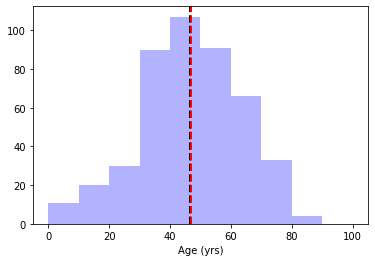

In [10]:
plt.hist(data_tmp.Age, range=(0,100), label='Age', color='blue', alpha=0.3)
plt.axvline(data_tmp.Age.mean(), color='k', linestyle='dashed', linewidth=2)
plt.axvline(data_tmp.Age.median(), color='red', linestyle='dashed', linewidth=2)
plt.xlabel('Age (yrs)')

plt.show()



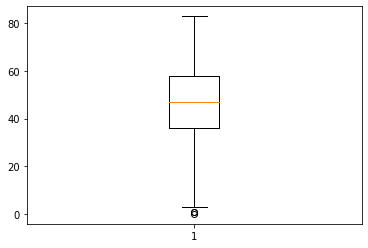

In [11]:

plt.boxplot(data_tmp.Age)
plt.show()

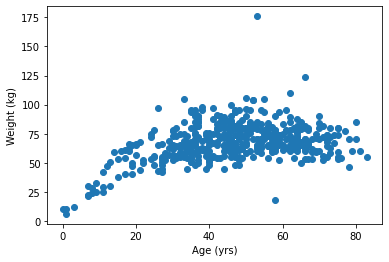

In [12]:
plt.scatter(data_tmp.Age, data_tmp.Weight)
plt.xlabel('Age (yrs)')
plt.ylabel('Weight (kg)')
plt.show()
#čini se ok, osim jedne točke na cca x = 68, y = 24

Odd weight:  1


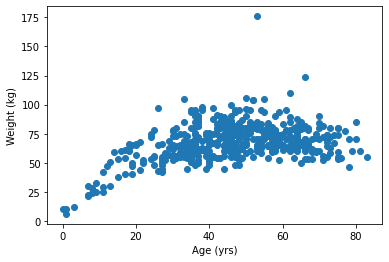

In [13]:
print('Odd weight: ', ((data_tmp.Age > 40) & (data_tmp.Weight < 30)).sum())
data_tmp.loc[(data_tmp.Age > 40) & (data_tmp.Weight < 30),'Weight'] = data_tmp.loc[:,'Weight'].median()
#Postoji netko tko ima manje od 30 kg, i gotovo 60 godina - to nije realna težina pa ju zamjenjujemo s medijanom
plt.scatter(data_tmp.Age, data_tmp.Weight)
plt.xlabel('Age (yrs)')
plt.ylabel('Weight (kg)')
plt.show()
#nema više stršeće težine :)

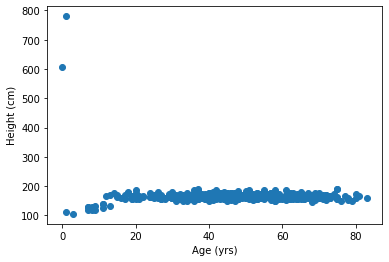

In [14]:
plt.scatter(data_tmp.Age, data_tmp.Height)
plt.xlabel('Age (yrs)')
plt.ylabel('Height (cm)')
plt.show()

Odd height:  2


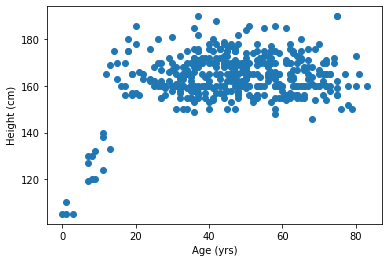

In [15]:
print('Odd height: ', (data_tmp.Height > 200).sum())
data_tmp.loc[(data_tmp.Height > 200),'Height'] = data_tmp.loc[:,'Height'].min()
# za dvije osobe visina je označena krivo, zamijenimo ju s minimumom visine budući da se radi o jako mladim osobama
plt.scatter(data_tmp.Age, data_tmp.Height)
plt.xlabel('Age (yrs)')
plt.ylabel('Height (cm)')
plt.show()

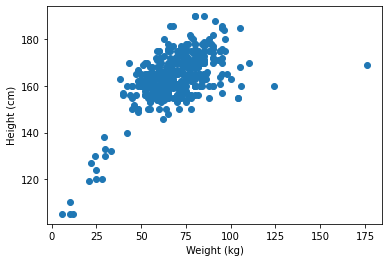

In [16]:
plt.scatter(data_tmp.Weight, data_tmp.Height)
plt.xlabel('Weight (kg)')
plt.ylabel('Height (cm)')
plt.show()

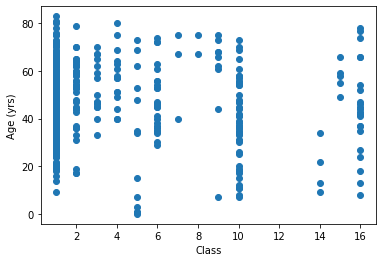

In [17]:
plt.scatter(data_tmp.Class, data_tmp.Age)

plt.xlabel('Class')
plt.ylabel('Age (yrs)')
plt.show()

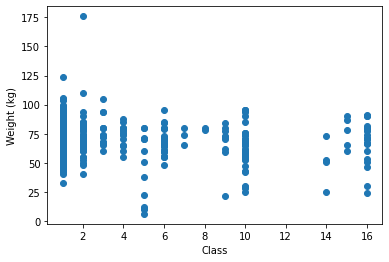

In [21]:
plt.scatter(data_tmp.Class, data_tmp.Weight)

plt.xlabel('Class')
plt.ylabel('Weight (kg)')
plt.show()

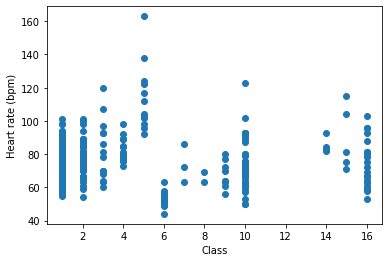

In [22]:
plt.scatter(data_tmp.Class, data_tmp.HeartRate)

plt.xlabel('Class')
plt.ylabel('Heart rate (bpm)')
plt.show()

In [18]:
filename1 = "data_edited.csv"
data_tmp.to_csv(filename1, index = False)
#ovime smo spremili do sada uređivani dataset - ne sadrži NaN vrijednosti i bez Jangle stupca, uz prepravke oko visine i težine

In [19]:
with pd.option_context("display.max_rows", None, 'display.max_columns', None):
    display(data_tmp.describe(include='all'))

,Age,Sex,Height,Weight,QRSduration,PRinterval,QTinterval,Tinterval,Pinterval,QRSangle,Tangle,Pangle,QRSTangle,HeartRate,DIQwidth,DIRwidth,DISwidth,DISmallRwidth,DISmallSwidth,DIIntDeflNum,DIRaggedR,DIDiphasicR,DIRaggedP,DIDiphasicP,DIRaggedT,DIDiphasicT,DIIQwidth,DIIRwidth,DIISwidth,DIISmallRwidth,DIISmallSwidth,DIIIntDeflNum,DIIRaggedR,DIIDiphasicR,DIIRaggedP,DIIDiphasicP,DIIRaggedT,DIIDiphasicT,DIIIQwidth,DIIIRwidth,DIIISwidth,DIIISmallRwidth,DIIISmallSwidth,DIIIIntDeflNum,DIIIRaggedR,DIIIDiphasicR,DIIIRaggedP,DIIIDiphasicP,DIIIRaggedT,DIIIDiphasicT,AVRQwidth,AVRRwidth,AVRSwidth,AVRSmallRwidth,AVRSmallSwidth,AVRIntDeflNum,AVRRaggedR,AVRDiphasicR,AVRRaggedP,AVRDiphasicP,AVRRaggedT,AVRDiphasicT,AVLQwidth,AVLRwidth,AVLSwidth,AVLSmallRwidth,AVLSmallSwidth,AVLIntDeflNum,AVLRaggedR,AVLDiphasicR,AVLRaggedP,AVLDiphasicP,AVLRaggedT,AVLDiphasicT,AVFQwidth,AVFRwidth,AVFSwidth,AVFSmallRwidth,AVFSmallSwidth,AVFIntDeflNum,AVFRaggedR,AVFDiphasicR,AVFRaggedP,AVFDiphasicP,AVFRaggedT,AVFDiphasicT,V1Qwidth,V1Rwidth,V1Swidth,V1SmallRwidth,V1SmallSwidth,V1IntDeflNum,V1RaggedR,V1DiphasicR,V1RaggedP,V1DiphasicP,V1RaggedT,V1DiphasicT,V2Qwidth,V2Rwidth,V2Swidth,V2SmallRwidth,V2SmallSwidth,V2IntDeflNum,V2RaggedR,V2DiphasicR,V2RaggedP,V2DiphasicP,V2RaggedT,V2DiphasicT,V3Qwidth,V3Rwidth,V3Swidth,V3SmallRwidth,V3SmallSwidth,V3IntDeflNum,V3RaggedR,V3DiphasicR,V3RaggedP,V3DiphasicP,V3RaggedT,V3DiphasicT,V4Qwidth,V4Rwidth,V4Swidth,V4SmallRwidth,V4SmallSwidth,V4IntDeflNum,V4RaggedR,V4DiphasicR,V4RaggedP,V4DiphasicP,V4RaggedT,V4DiphasicT,V5Qwidth,V5Rwidth,V5Swidth,V5SmallRwidth,V5SmallSwidth,V5IntDeflNum,V5RaggedR,V5DiphasicR,V5RaggedP,V5DiphasicP,V5RaggedT,V5DiphasicT,V6Qwidth,V6Rwidth,V6Swidth,V6SmallRwidth,V6SmallSwidth,V6IntDeflNum,V6RaggedR,V6DiphasicR,V6RaggedP,V6DiphasicP,V6RaggedT,V6DiphasicT,DIJJamp,DIQamp,DIRamp,DISamp,DISmallRamp,DISmallSamp,DIPamp,DITamp,DIQRSA,DIQRSTA,DIIJJamp,DIIQamp,DIIRamp,DIISamp,DIISmallRamp,DIISmallSamp,DIIPamp,DIITamp,DIIQRSA,DIIQRSTA,DIIIJJamp,DIIIQamp,DIIIRamp,DIIISamp,DIIISmallRamp,DIIISmallSamp,DIIIPamp,DIIITamp,DIIIQRSA,DIIIQRSTA,AVRJJamp,AVRQamp,AVRRamp,AVRSamp,AVRSmallRamp,AVRSmallSamp,AVRPamp,AVRTamp,AVRQRSA,AVRQRSTA,AVLJJamp,AVLQamp,AVLRamp,AVLSamp,AVLSmallRamp,AVLSmallSamp,AVLPamp,AVLTamp,AVLQRSA,AVLQRSTA,AVFJJamp,AVFQamp,AVFRamp,AVFSamp,AVFSmallRamp,AVFSmallSamp,AVFPamp,AVFTamp,AVFQRSA,AVFQRSTA,V1JJamp,V1Qamp,V1Ramp,V1Samp,V1SmallRamp,V1SmallSamp,V1Pamp,V1Tamp,V1QRSA,V1QRSTA,V2JJamp,V2Qamp,V2Ramp,V2Samp,V2SmallRamp,V2SmallSamp,V2Pamp,V2Tamp,V2QRSA,V2QRSTA,V3JJamp,V3Qamp,V3Ramp,V3Samp,V3SmallRamp,V3SmallSamp,V3Pamp,V3Tamp,V3QRSA,V3QRSTA,V4JJamp,V4Qamp,V4Ramp,V4Samp,V4SmallRamp,V4SmallSamp,V4Pamp,V4Tamp,V4QRSA,V4QRSTA,V5JJamp,V5Qamp,V5Ramp,V5Samp,V5SmallRamp,V5SmallSamp,V5Pamp,V5Tamp,V5QRSA,V5QRSTA,V6JJamp,V6Qamp,V6Ramp,V6Samp,V6SmallRamp,V6SmallSamp,V6Pamp,V6Tamp,V6QRSA,V6QRSTA,Class
count,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.0,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.00000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.0,452.000000,452.0,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.0,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000

[['Tangle', 3288.6068078802264], ['QRSangle', 2064.015167866884], ['PRinterval', 2010.8303033573375], ['V3QRSTA', 1395.9406103938152], ['QRSTangle', 1294.6395375076033], ['Tinterval', 1269.7158085277556], ['V4QRSTA', 1180.7239952024017], ['QTinterval', 1114.5863665796753], ['V3QRSA', 1034.073140513706], ['Pangle', 821.5315179640131], ['AVRIntDeflNum', 781.1354119655437], ['V1Qwidth', 719.7435001864097], ['V2QRSTA', 710.5665676569274], ['Pinterval', 667.0155014422228], ['V2QRSA', 658.4253778231267], ['DIIISwidth', 643.4047446186449], ['V4QRSA', 628.7403329376216], ['AVRQwidth', 615.7172850891825], ['V5QRSTA', 596.416633783333], ['V1Swidth', 569.5633302592076], ['V1QRSA', 562.4015746718208], ['AVFSwidth', 537.8919608343308], ['DIIIRwidth', 533.8888213017287], ['AVLSwidth', 529.003394619626], ['AVLRwidth', 512.1739301061554], ['V6Swidth', 497.3229205502031], ['DIIIQwidth', 479.8928634499539], ['DIISwidth', 443.56784333732315], ['V1QRSTA', 441.5919072170006], ['V2Qwidth', 440.3360084767381

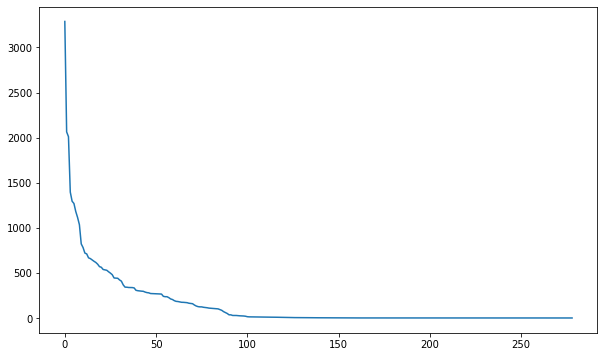

In [20]:
#varijanca po uzoru na rad
var_list = []
var_temp = [] #prvi clan ce biti ime stupca, drugi varijanca za tu znacajku
num_list = []
name_list =[]
cols=list(data_tmp.columns.values)
for col1 in cols:
  var_temp.append(col1)
  var_temp.append(data_tmp[col1].var())
  var_list.append(var_temp)
  var_temp=[]

var_list.sort(reverse = True, key=lambda x: x[1]) #sortiraj silazno po varijanci
print(var_list)
for i in range(len(var_list)):
  num_list.append(var_list[i][1])
  name_list.append(var_list[i][0])
plt.figure(figsize=(10, 6))
plt.plot(num_list)
plt.show()


In [26]:
no_zero_var= []
for i in var_list:
  if i[1] != 0:
    no_zero_var.append(i)
#plt.figure(figsize=(10, 6))
#plt.plot(no_zero_var)
#plt.show()
print(no_zero_var)

[['Tangle', 3288.6068078802264], ['QRSangle', 2064.015167866884], ['PRinterval', 2010.8303033573375], ['V3QRSTA', 1395.9406103938152], ['QRSTangle', 1294.6395375076033], ['Tinterval', 1269.7158085277556], ['V4QRSTA', 1180.7239952024017], ['QTinterval', 1114.5863665796753], ['V3QRSA', 1034.073140513706], ['Pangle', 821.5315179640131], ['AVRIntDeflNum', 781.1354119655437], ['V1Qwidth', 719.7435001864097], ['V2QRSTA', 710.5665676569274], ['Pinterval', 667.0155014422228], ['V2QRSA', 658.4253778231267], ['DIIISwidth', 643.4047446186449], ['V4QRSA', 628.7403329376216], ['AVRQwidth', 615.7172850891825], ['V5QRSTA', 596.416633783333], ['V1Swidth', 569.5633302592076], ['V1QRSA', 562.4015746718208], ['AVFSwidth', 537.8919608343308], ['DIIIRwidth', 533.8888213017287], ['AVLSwidth', 529.003394619626], ['AVLRwidth', 512.1739301061554], ['V6Swidth', 497.3229205502031], ['DIIIQwidth', 479.8928634499539], ['DIISwidth', 443.56784333732315], ['V1QRSTA', 441.5919072170006], ['V2Qwidth', 440.3360084767381

In [37]:
#opcija 1 : uzmi zadnjih 150 iz var_list
first150 = []
#opcija 2: uzmi zadnjih 150 iz no_zero_var
first150_no_zeros = []
no_zero_var.sort(key=lambda x: x[1])
var_list.sort(key=lambda x: x[1])
for j in range(150):
  first150.append(var_list[j][0])
  first150_no_zeros.append(no_zero_var[j][0])
#print(first150)
#print(first150_no_zeros)
#data150 = data_tmp.copy()
#data150nz = data_tmp.copy()
#data_tmp.drop(['Jangle'], axis=1, inplace=True)
#for colname in cols:
  #if colname not in first150:
   # data150.drop([colname], axis=1, inplace=True) #ako stupac nije u prvih 150, makni ga
 # if colname not in first150_no_zeros:
    #data150nz.drop([colname], axis=1, inplace=True)

#print(data150.shape)
#print(data150nz.shape)

#filename2 = "data150.csv"
#data150.to_csv(filename2, index = False)
#filename3 = "data150nz.csv"
#data150nz.to_csv(filename3, index = False)